# Import libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-_eb0zl5n
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-_eb0zl5n
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=8320de5ea5e7bdada2ef0f63463414b894f3bf2cdc40e0681b82a79add50004f
  Stored in directory: /tmp/pip-ephem-wheel-cache-nsoi7b23/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations


In [3]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

fatal: destination path 'torch_cv_wrapper' already exists and is not an empty directory.


In [4]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [5]:
config = helper.process_config("/content/drive/MyDrive/Cifar10_Resnet/session8_assignment/Cifar10_with_resnet18_BN_LR.yml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'LRScheduler',
 'model': 'Resnet18',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'Cifar10_with_resnet18_BN_LR',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_params': 

## Create Training Instance

In [6]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [7]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


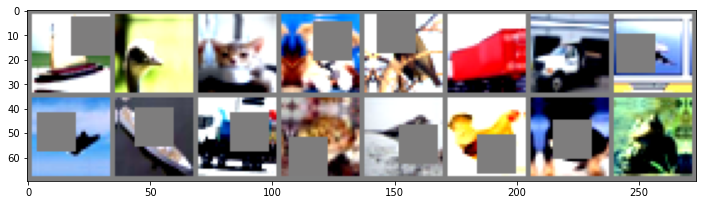

In [8]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [9]:
model = resnet.ResNet18("BN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
      BatchNorm2d-14          [-1, 128,

## Trigger training

In [10]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch 1:


Loss=1.3916068077087402 Batch_id=195 LR=0.00100 Accuracy=37.63: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0064, Accuracy: 4232/10000 (42.32%)

Epoch 2:


Loss=1.2535991668701172 Batch_id=195 LR=0.00100 Accuracy=51.45: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0045, Accuracy: 6058/10000 (60.58%)

Epoch 3:


Loss=1.1531704664230347 Batch_id=195 LR=0.00100 Accuracy=59.40: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0047, Accuracy: 5990/10000 (59.90%)

Epoch 4:


Loss=1.1463053226470947 Batch_id=195 LR=0.00100 Accuracy=64.06: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0041, Accuracy: 6388/10000 (63.88%)

Epoch 5:


Loss=1.0291517972946167 Batch_id=195 LR=0.00100 Accuracy=67.75: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 7121/10000 (71.21%)

Epoch 6:


Loss=0.9718118906021118 Batch_id=195 LR=0.00100 Accuracy=70.55: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 7198/10000 (71.98%)

Epoch 7:


Loss=0.6834351420402527 Batch_id=195 LR=0.00100 Accuracy=73.10: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 6861/10000 (68.61%)

Epoch 8:


Loss=0.5895484685897827 Batch_id=195 LR=0.00100 Accuracy=75.44: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 7821/10000 (78.21%)

Epoch 9:


Loss=1.0183241367340088 Batch_id=195 LR=0.00100 Accuracy=76.86: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 7904/10000 (79.04%)

Epoch 10:


Loss=0.6940885782241821 Batch_id=195 LR=0.00100 Accuracy=78.33: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 7731/10000 (77.31%)

Epoch 11:


Loss=0.6737518310546875 Batch_id=195 LR=0.00100 Accuracy=79.21: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7726/10000 (77.26%)

Epoch 12:


Loss=0.695816159248352 Batch_id=195 LR=0.00100 Accuracy=80.08: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 8027/10000 (80.27%)

Epoch 13:


Loss=0.6078971028327942 Batch_id=195 LR=0.00100 Accuracy=81.02: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8172/10000 (81.72%)

Epoch 14:


Loss=0.568888783454895 Batch_id=195 LR=0.00100 Accuracy=81.84: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 8110/10000 (81.10%)

Epoch 15:


Loss=0.4281131625175476 Batch_id=195 LR=0.00100 Accuracy=82.51: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8355/10000 (83.55%)

Epoch 16:


Loss=0.6813528537750244 Batch_id=195 LR=0.00100 Accuracy=83.56: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 8113/10000 (81.13%)

Epoch 17:


Loss=0.45326656103134155 Batch_id=195 LR=0.00100 Accuracy=83.86: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8310/10000 (83.10%)

Epoch 18:


Loss=0.384700208902359 Batch_id=195 LR=0.00100 Accuracy=84.48: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 8113/10000 (81.13%)

Epoch 19:


Loss=0.3085808753967285 Batch_id=195 LR=0.00100 Accuracy=84.93: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0020, Accuracy: 8348/10000 (83.48%)

Epoch    19: reducing learning rate of group 0 to 2.0000e-04.
Epoch 20:


Loss=0.16255947947502136 Batch_id=195 LR=0.00020 Accuracy=89.14: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9071/10000 (90.71%)

Epoch 21:


Loss=0.38183239102363586 Batch_id=195 LR=0.00020 Accuracy=90.51: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9073/10000 (90.73%)

Epoch 22:


Loss=0.19606837630271912 Batch_id=195 LR=0.00020 Accuracy=90.83: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9113/10000 (91.13%)

Epoch 23:


Loss=0.24085691571235657 Batch_id=195 LR=0.00020 Accuracy=91.19: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9030/10000 (90.30%)

Epoch 24:


Loss=0.28269991278648376 Batch_id=195 LR=0.00020 Accuracy=91.68: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9024/10000 (90.24%)

Epoch 25:


Loss=0.2677798867225647 Batch_id=195 LR=0.00020 Accuracy=91.63: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9158/10000 (91.58%)

Epoch 26:


Loss=0.16879917681217194 Batch_id=195 LR=0.00020 Accuracy=92.23: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9126/10000 (91.26%)

Epoch 27:


Loss=0.1735125482082367 Batch_id=195 LR=0.00020 Accuracy=92.43: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9112/10000 (91.12%)

Epoch 28:


Loss=0.16111433506011963 Batch_id=195 LR=0.00020 Accuracy=92.55: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9073/10000 (90.73%)

Epoch 29:


Loss=0.15835657715797424 Batch_id=195 LR=0.00020 Accuracy=92.82: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9040/10000 (90.40%)

Epoch    29: reducing learning rate of group 0 to 4.0000e-05.
Epoch 30:


Loss=0.1685132086277008 Batch_id=195 LR=0.00004 Accuracy=93.99: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9253/10000 (92.53%)

Epoch 31:


Loss=0.1821473389863968 Batch_id=195 LR=0.00004 Accuracy=94.49: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9267/10000 (92.67%)

Epoch 32:


Loss=0.288369745016098 Batch_id=195 LR=0.00004 Accuracy=94.52: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9255/10000 (92.55%)

Epoch 33:


Loss=0.1987394541501999 Batch_id=195 LR=0.00004 Accuracy=94.74: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9245/10000 (92.45%)

Epoch 34:


Loss=0.10040372610092163 Batch_id=195 LR=0.00004 Accuracy=94.91: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9248/10000 (92.48%)

Epoch 35:


Loss=0.12049613147974014 Batch_id=195 LR=0.00004 Accuracy=94.89: 100%|██████████| 196/196 [00:56<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9256/10000 (92.56%)

Epoch    35: reducing learning rate of group 0 to 8.0000e-06.
Epoch 36:


Loss=0.08085507154464722 Batch_id=195 LR=0.00001 Accuracy=95.18: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9267/10000 (92.67%)

Epoch 37:


Loss=0.09800897538661957 Batch_id=195 LR=0.00001 Accuracy=95.27: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9276/10000 (92.76%)

Epoch 38:


Loss=0.16754944622516632 Batch_id=195 LR=0.00001 Accuracy=95.27: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9270/10000 (92.70%)

Epoch 39:


Loss=0.09991950541734695 Batch_id=195 LR=0.00001 Accuracy=95.17: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9277/10000 (92.77%)

Epoch 40:


Loss=0.11980777978897095 Batch_id=195 LR=0.00001 Accuracy=95.44: 100%|██████████| 196/196 [00:55<00:00,  3.50it/s]



Test set: Average loss: 0.0009, Accuracy: 9284/10000 (92.84%)



## Missclassification

Total wrong predictions are 716
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


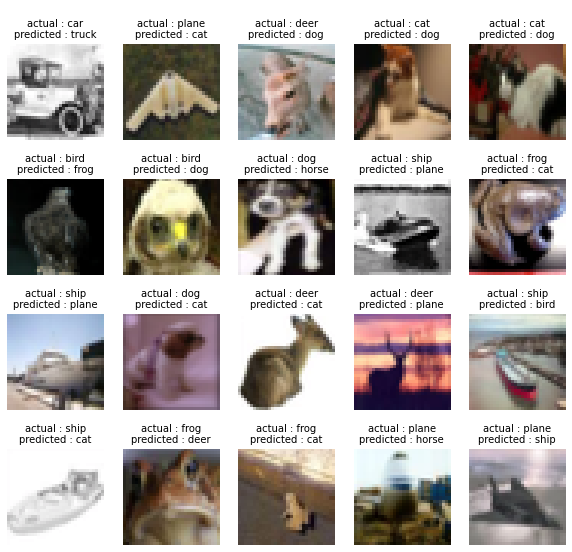

In [11]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

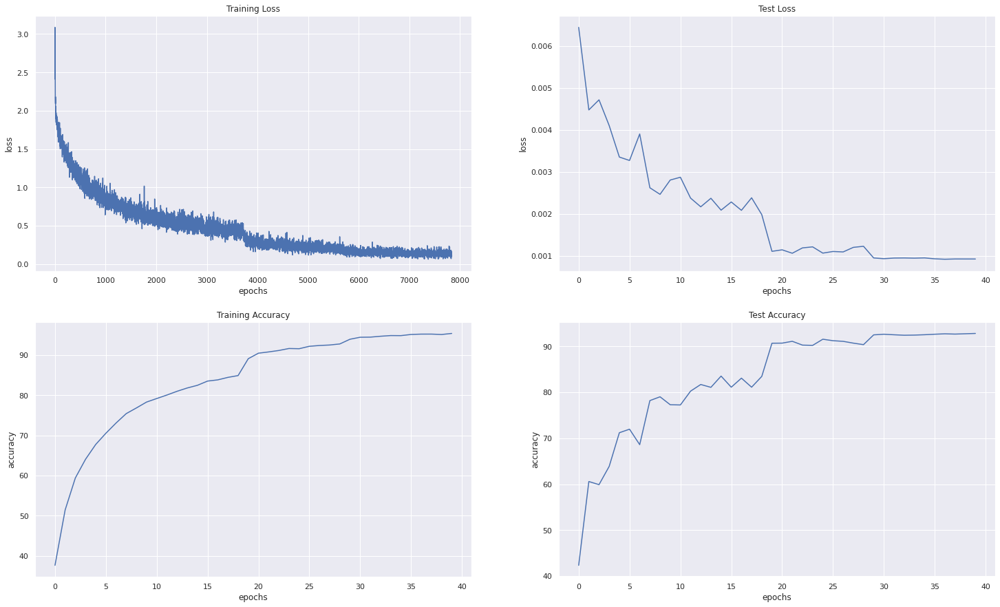

In [12]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [13]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 95 %
Accuracy of   car : 97 %
Accuracy of  bird : 89 %
Accuracy of   cat : 85 %
Accuracy of  deer : 92 %
Accuracy of   dog : 87 %
Accuracy of  frog : 95 %
Accuracy of horse : 94 %
Accuracy of  ship : 94 %
Accuracy of truck : 96 %


## Plot Confusion Matrix

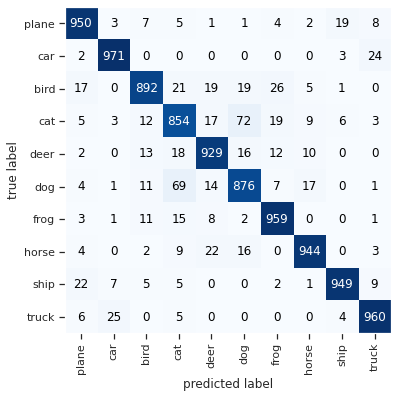

In [14]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


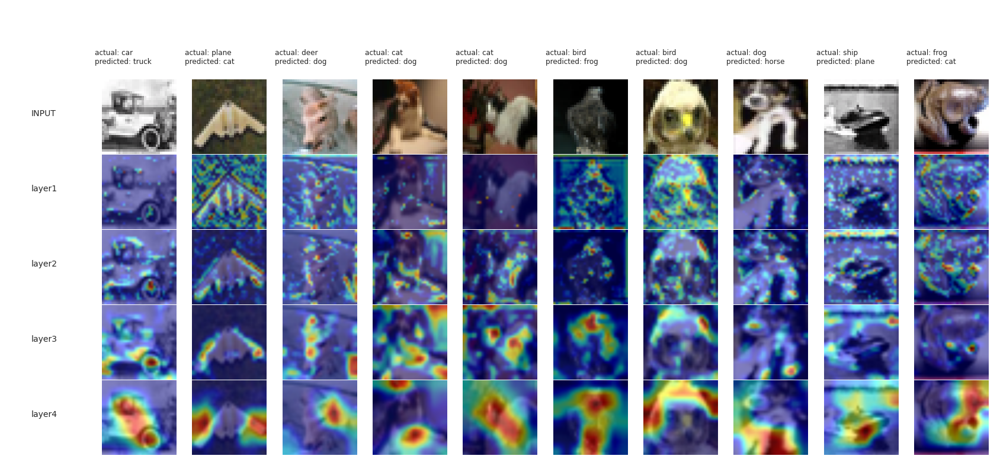

In [15]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


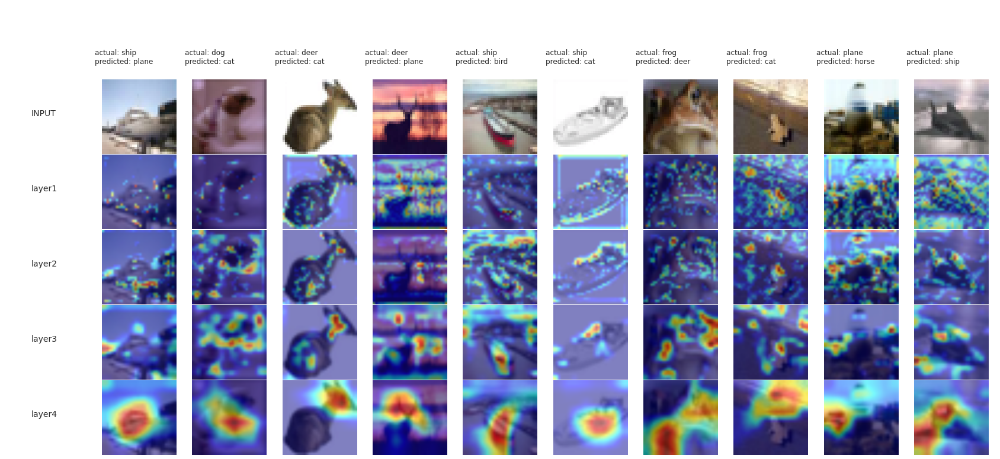

In [16]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [17]:

%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>